# Worksheet 07

Name 1: Houjie Jiang   
UID  1: U65333668

Name 2: Jingyi Zhang
UID  2: U26578499

### Topics

- Density-Based Clustering

### Density-Based Clustering

Follow along with the live coding of the DBScan algorithm.

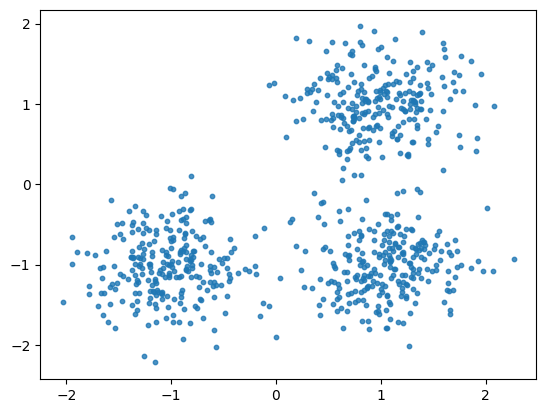

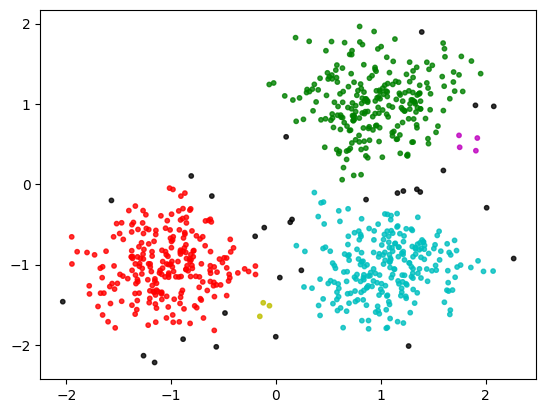

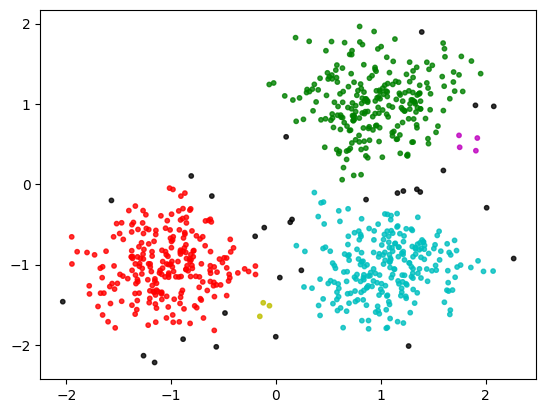

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)
plt.scatter(X[:,0],X[:,1],s=10, alpha=0.8)
plt.show()

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon

    def dbscan(self):
        labels = [0] * len(self.dataset)
        cluster_id = 0

        for i in range(len(self.dataset)):
            if labels[i] != 0:
                continue
            
            neighbors = self.find_neighbors(i)

            if len(neighbors) < self.min_pts:
                labels[i] = -1  # Mark as noise
            else:
                cluster_id = cluster_id + 1
                self.expand_cluster(i, neighbors, cluster_id, labels)

        return labels

    def find_neighbors(self, index):
        neighbors = []
        for i in range(len(self.dataset)):
            if np.linalg.norm(self.dataset[i] - self.dataset[index]) < self.epsilon:
                neighbors.append(i)
        return neighbors

    def expand_cluster(self, index, neighbors, cluster_id, labels):
        labels[index] = cluster_id
        i = 0
        while i < len(neighbors):
            neighbor_index = neighbors[i]
            if labels[neighbor_index] == -1:
                labels[neighbor_index] = cluster_id
            elif labels[neighbor_index] == 0:
                labels[neighbor_index] = cluster_id
                neighbor_neighbors = self.find_neighbors(neighbor_index)
                if len(neighbor_neighbors) >= self.min_pts:
                    neighbors.extend(neighbor_neighbors)
            i = i + 1

clustering = DBC(X, 3, .2).dbscan()
colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 20)
plt.scatter(X[:, 0], X[:, 1], color=colors[clustering].tolist(), s=10, alpha=0.8)
plt.show()

## Challenge Problem

Using the code above and the template provided below, create the animation below of the DBScan algorithm.

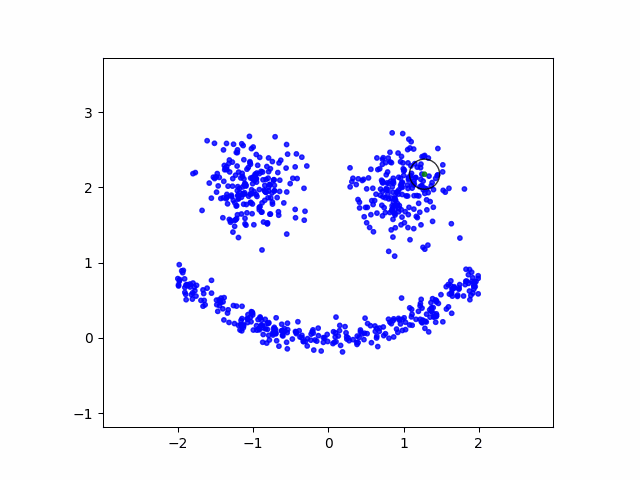

In [2]:
from IPython.display import Image
Image(filename="dbscan_2.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the matplotlib plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs

In [79]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():
    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []  # Store snapshots

    def snapshot(self, labels, point_index=-1, neighbors=[]):
        fig, ax = plt.subplots()

        colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
        colors = np.hstack([colors] * 20)
        
        ax.scatter(self.dataset[:, 0], self.dataset[:, 1], color=colors[labels].tolist(), alpha=0.6)

        cir = plt.Circle((self.dataset[point_index, 0], self.dataset[point_index, 1]), self.epsilon, color='black', fill=False, linewidth=2)
        ax.add_patch(cir)

        ax.set_xlim(self.dataset[:, 0].min() - 1, self.dataset[:, 0].max() + 1)
        ax.set_ylim(self.dataset[:, 1].min() - 1, self.dataset[:, 1].max() + 1)
        ax.set_aspect('equal') 

        plt.xticks([])
        plt.yticks([])
        plt.title("DBSCAN Clustering")

        fig.savefig(TEMPFILE, bbox_inches='tight')
        plt.close(fig)

        self.snaps.append(im.open(TEMPFILE).copy())
        
    def find_neighbors(self, index):
        neighbors = []
        for i, point in enumerate(self.dataset):
            if np.linalg.norm(point - self.dataset[index]) < self.epsilon:
                neighbors.append(i)
        return neighbors

    def expand_cluster(self, index, neighbors, cluster_id, labels):
        labels[index] = cluster_id
        self.snapshot(labels, index, neighbors)
        i = 0
        while i < len(neighbors):
            neighbor_index = neighbors[i]
            if labels[neighbor_index] == -1 or labels[neighbor_index] == 0:
                labels[neighbor_index] = cluster_id
                self.snapshot(labels, neighbor_index)
                neighbor_neighbors = self.find_neighbors(neighbor_index)
                if len(neighbor_neighbors) >= self.min_pts:
                    neighbors.extend(neighbor_neighbors)
            i += 1

    def dbscan(self):
        labels = [0] * len(self.dataset)
        cluster_id = 0

        for i in range(len(self.dataset)):
            if labels[i] != 0:
                continue

            neighbors = self.find_neighbors(i)

            if len(neighbors) < self.min_pts:
                labels[i] = -1  
                self.snapshot(labels, i)
            else:
                cluster_id += 1
                self.expand_cluster(i, neighbors, cluster_id, labels)

        self.snapshot(labels)  
        return labels

centers = [[-1, 2], [1, 2]]
eyes, _ = datasets.make_blobs(n_samples=300, centers=centers, cluster_std=0.3,
                            random_state=0)

mouth_x = 4 * np.random.random(150) - 2
mouth_y = 0.2 * mouth_x**2 + .1 * np.random.randn(mouth_x.size)

face = np.append(eyes, list(zip(mouth_x, mouth_y)), axis=0)

dbc = DBC(face, 3, .2)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'dbscan.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)

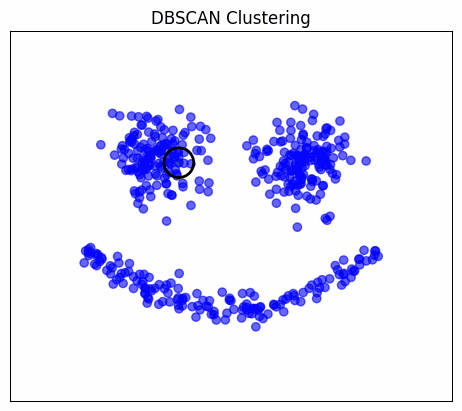

In [80]:
from IPython.display import Image
Image(filename="dbscan.gif", width=500, height=500)